In [1]:
## import necessary packages
import pandas as pd
from pandas.plotting import scatter_matrix
import numpy as np
from sklearn.preprocessing import OneHotEncoder
import matplotlib.pyplot as plt

# Exploratory Data Analysis

In [2]:
# Convert CSV to Pandas DF
diabetes_filename = 'Diabetes with Population Info by County 2017.csv'
df = pd.read_csv(diabetes_filename)

## Choropleth Map: Diabates Number by County

In [ ]:
# Documentation relied upon at: https://plotly.com/python/choropleth-maps/
#To install plotly I had to go to terminal and run: conda install -c https://conda.anaconda.org/plotly plotly -LL
from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)
    
from plotly import express as px

df_choro = df[['CountyFIPS', 'Diabetes_Number']] #make dataframe with two columns to hopefully speed up process

fig = px.choropleth(df_choro, geojson=counties, locations='CountyFIPS', color='Diabetes_Number',
                           color_continuous_scale="Viridis",
                           range_color=(0, 12),
                           scope="usa",
                           labels={'Diabetes_Number':'Diabetes Number'}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [5]:
### data cleaning

# drop county
df = df.drop(columns=['County', 'CountyFIPS']) #should drop CountyFIPS as well since it IDs county -LL
# convert state to one-hot-encoding
onehotencoder = OneHotEncoder()
onehotencoder.fit(df['State'].to_numpy().reshape(-1, 1))
state_array = onehotencoder.transform(df['State'].to_numpy().reshape(-1, 1)).todense()

df_states = pd.DataFrame(state_array)
df_wo_states = df.drop(columns=['State'])
df_cleaned = pd.concat([df_states, df_wo_states], axis=1)
# drop rows with 'No Data' in Diabetes_Number column
df_cleaned = df_cleaned[df_cleaned['Diabetes_Number'] != 'No Data']
# drop rows with '-' in target_col
target_col = 'sex and age_total population_65 years and over_sex ratio (males per 100 females)'
df_cleaned = df_cleaned[df_cleaned[target_col] != '-']

for col in df_cleaned.columns:
    df_cleaned[col] = df_cleaned[col].astype('float64')

# shape: 3113*145

ValueError: could not convert string to float: 'Suppressed'

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1179e0160>,
      dtype=object)

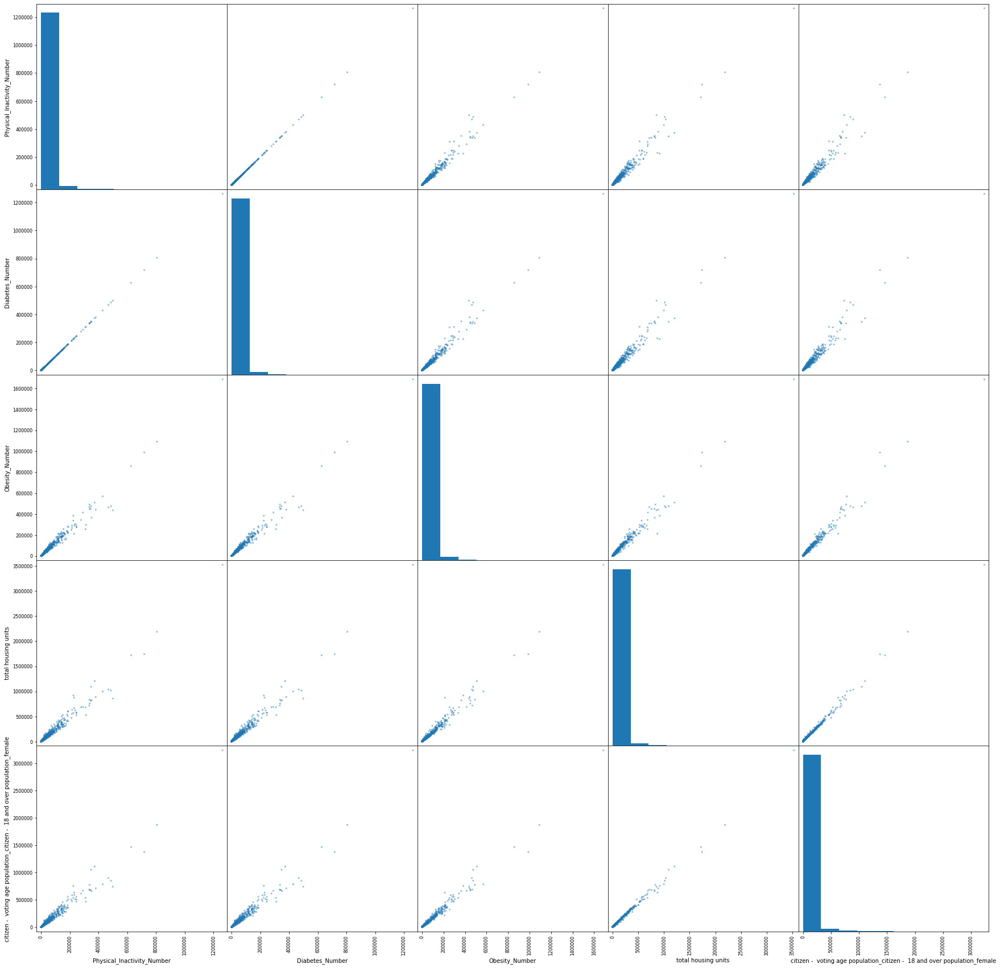

In [92]:
### EDA: get correlation with Diabetes_Number
corr_w_diab_num = df_cleaned.corr()['Diabetes_Number']
cols = corr_w_diab_num.axes[0].to_list()
col2corr = {col:corr_w_diab_num[col] for col in cols}
col_corr = sorted(col2corr.items(), key=lambda x: x[1])
top_correlated_cols = [p[0] for p in col_corr[-5:][::-1]]
scatter_matrix(df_cleaned[top_correlated_cols], figsize=(30, 30))